# MANIPULACIÓN Y VISUALIZACIÓN DE UNA NUBE DE PUNTOS EN PYTHON
**Autores: Darío Solano, Brenda Ortíz y Josué García. 
División de Ingeniería en Ciencias de la Tierra, Facultad de ingeniería, UNAM, 2021.**
<br>**Contacto: dsolano@unam.mx, dario.e.solano@gmail.com**
<br> Notebook disponible para descarga en: https://github.com/dariosolano/cloud_points
<br>Visualización en línea disponible en: https://nbviewer.jupyter.org/github/dariosolano/cloud_points/blob/main/Manipulacion_y_visualizacion_nubes_puntos_Dario_Solano.ipynb

## Introducción

Las nubes de puntos generadas a partir de técnicas fotogramétricas o de barridos de LiDAR tienen la característica de ser de un volumen considerable. Contrario a la inuición inicial que uno pudiera tener, las nubes de puntos no son un elemento gráfico, sino que son texto, el cual debe ser interpretado para poder generar una visualización. La mayoría de los osftwares especializados en nubes de puntos son capaces de realizar una visualización básica de las nubes de puntos. Sin embargo, manipular las nubes para enfocarse en las áreas y atributos de interés de las mismas no siempre es una tarea fácil. 

En este ejercicio se aborda el cómo manipular una nube de puntos utilizando herramientas de python, al tiempo que se abordan diferentes consideraciones y técnicas de visualización de las mismas. La nube de puntos que vamos a explorar corresponde a una de las paredes de basalto de la Casa Club del Acadmémico. Dicha pared tiene basaltos de diferentes texturas, sombras, vegetación y cortes hechos para la explotación de la roca como material de construcción. La nube en cuestión se hizo a partir de un levantamiento fotogramétrico con drones y tiene un tamaño aproximado de 1 Gb. 

Para la realización de este ejercicio vamos a utilizar numpy, matplotlib y open 3d. 

## Importación de librerías y lectura de datos

In [1]:
#En esta parte importamos las librerías necesarias y definimos los parámetros para la visualización de las figuras
#%matplotlib notebook   #descomentar para visualización interactiva
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
matplotlib.rcParams['figure.figsize'] = [14, 9]
matplotlib.rcParams['figure.dpi'] = 400

In [2]:
#Aquí leemos la nube de puntos. Tú necesitas cambiar esta ruta para leerla en tu compu ;)
file_data_path='/Users/dario/Downloads/CCA_15m_Highest.txt'
point_cloud= np.loadtxt(file_data_path,skiprows=1) #Le vamos a dejar que se salte la primera fila solo por precauci'on ;)

## Conociendo la nube de puntos

In [3]:
type(point_cloud)

numpy.ndarray

In [4]:
print("ndim: ", point_cloud.ndim) #número de dimensiones
print("shape:", point_cloud.shape) #la dimensión en filas x columnas
print("size: ", point_cloud.size) #el número total de elementos

ndim:  2
shape: (13941703, 9)
size:  125475327


In [5]:
print("\nHay ", point_cloud.shape[0], "puntos en esta nube de puntos de ejemplo!\n"  ) #el número total de elementos 


Hay  13941703 puntos en esta nube de puntos de ejemplo!



In [6]:
print(point_cloud[0, :])  # first row of x2

[ 4.79328470e+05  2.13789256e+06  2.28447830e+03  3.10000000e+01
  3.10000000e+01  2.90000000e+01 -9.26565000e-01  2.80720000e-01
 -2.50347000e-01]


Las primeros tres elementos son las coordenadas X, Y, Z
Los siguientes tres elementos son los colores RGB que van de 0 a 255
Los siguientes tres elementos son el vector normal unitario de cada punto de la nube

## Visualizaciones con scatter en 3D

### 10 mil puntos sin color

Text(0.5, 0, 'Z [m]')

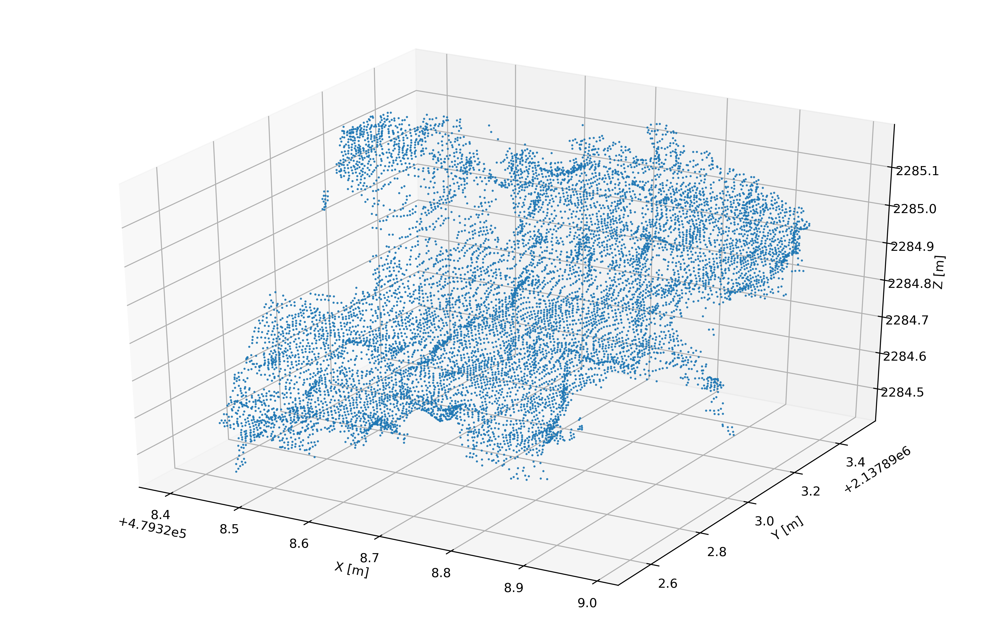

In [7]:
xyz=point_cloud[0:10000,:3] #Primero visualizamos 10000 de los ~14 millones de puntos
rgb=point_cloud[0:10000,3:6]

ax = plt.axes(projection='3d')#Después creamos unos ejes en 3D para poder colocar los puntos

#Aquí visualizamos los puntos sin color 
ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2],'.', s=0.5, alpha=0.9)

#Aquí ponemos las etiquetas
ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')

### 10 mil puntos con color de acuerdo a la elevación

Text(0.5, 0, 'Z [m]')

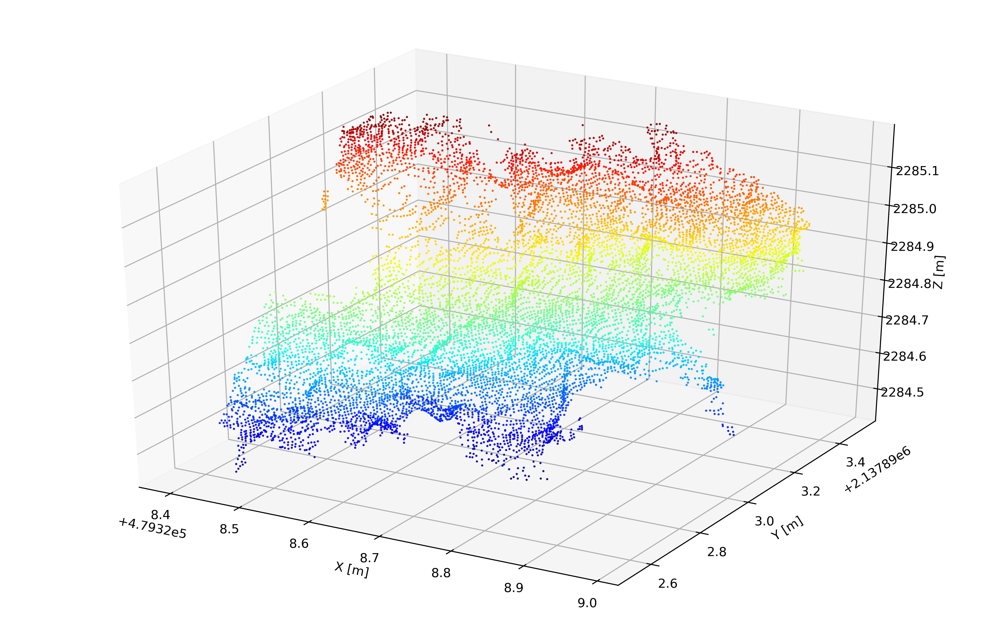

In [8]:
ax = plt.axes(projection='3d')

#Aquí visualizamos los puntos usando la elevación como el atributo para darle color 
ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2],'.',c=xyz[:,2],cmap=plt.cm.jet, s=0.5, alpha=0.9)

ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')

### 10 mil puntos con color real

Text(0.5, 0, 'Z [m]')

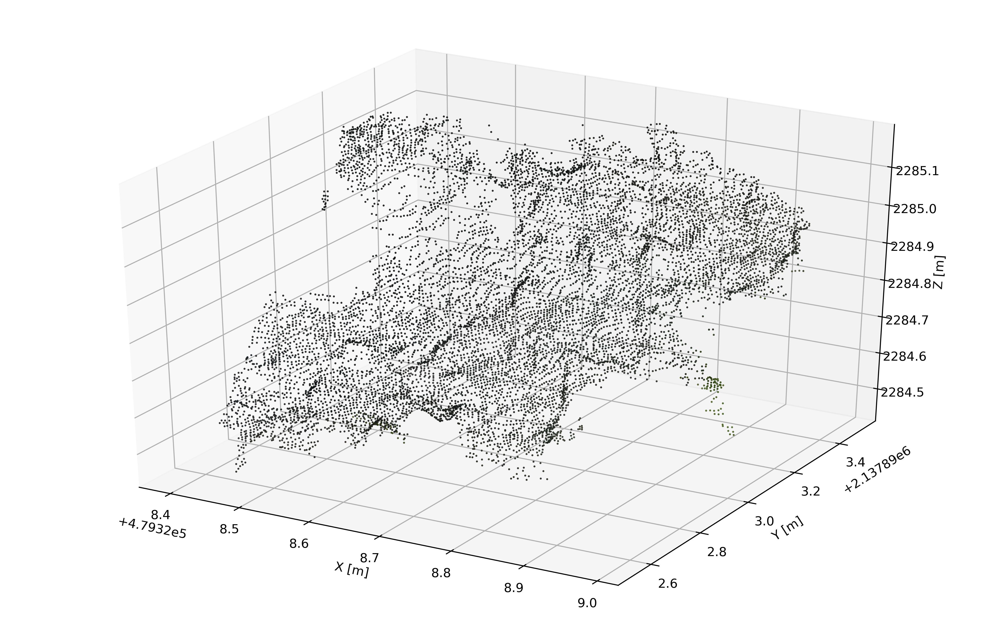

In [9]:
ax = plt.axes(projection='3d')

#Aquí visualizamos los puntos utilizando el color a partir del vector RGB
ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2],'.',c=rgb/255, s=0.3, alpha=0.9)

ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')

### 100 mil puntos con color real

Text(0.5, 0, 'Z [m]')

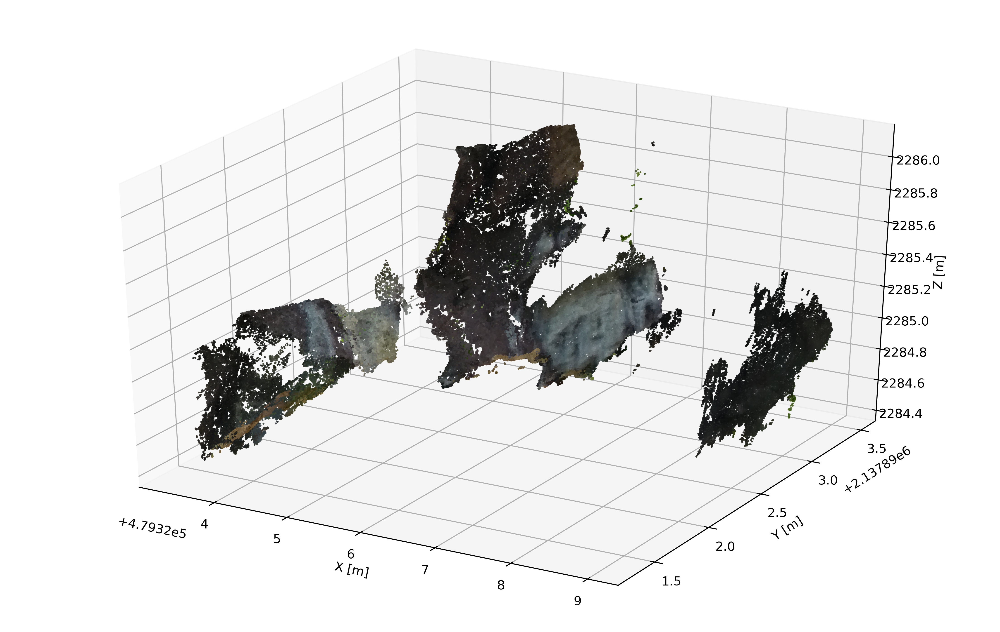

In [10]:
#Ahora vamos a usar 100 mil de los ~14 millones de puntos
xyz=point_cloud[0:100000,:3]
rgb=point_cloud[0:100000,3:6]

ax = plt.axes(projection='3d')
ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2],'.',c=rgb/255, s=0.3, alpha=0.9)
ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')

### 1 cada 50 puntos de los ~14 millones de puntos

In [ ]:
#Ahora vamos a usar 1 cada 50 de los ~14 millones de puntos
xyz=point_cloud[0::50,:3] #[start:end:step]
rgb=point_cloud[0::50,3:6]

ax = plt.axes(projection='3d')
ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2],'.',c=rgb/255, s=0.3, alpha=0.9)
ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')

### Obteniendo los valores relativos de X, Y, Z

In [ ]:
ax = plt.axes(projection='3d')

#En esta expresión le restamos el valor medio a los puntos para cada dirección
ax.scatter(xyz[:,0]-np.min(xyz[:,0]),xyz[:,1]-np.min(xyz[:,1]), xyz[:,2]-np.min(xyz[:,2]),'.',c=rgb/255, s=0.3, alpha=0.9)

ax.set_xlabel('X relativa [m]')
ax.set_ylabel('Y relativa [m]')
ax.set_zlabel('Z relativa [m]')

## Selección del 2% de los puntos usando probabilidad

In [ ]:
#Generamos una máscara de 0s y 1s usando probabilidades
#Vamos a usar X% de False y Y% de True
X=0.98
Y=1-X
np.random.seed(22) #Aqui uso el método seed para reproducibilidad del random generado abajo
mask = np.random.choice([False, True], len(point_cloud), p=[X, Y]) 
point_cloud1=point_cloud[mask]

In [ ]:
xyz=point_cloud1[:,:3]
rgb=point_cloud1[:,3:6]
ax = plt.axes(projection='3d')
ax.scatter(xyz[:,0]-np.min(xyz[:,0]),xyz[:,1]-np.min(xyz[:,1]), xyz[:,2]-np.min(xyz[:,2]),'.',c=rgb/255, s=0.3, alpha=0.9)
ax.set_xlabel('X relativa [m]');
ax.set_ylabel('Y relativa [m]');
ax.set_zlabel('Z relativa [m]');

## Selección espacial de un subset de datos

In [ ]:
min_Z=np.min(point_cloud1,axis=0)[2]
spatial_query=point_cloud1[abs(point_cloud1[:,2]-min_Z)<9]
xyz=spatial_query[:,:3]
rgb=spatial_query[:,3:6]
ax = plt.axes(projection='3d')
ax.scatter(xyz[:,0]-np.min(xyz[:,0]),xyz[:,1]-np.min(xyz[:,1]), xyz[:,2]-np.min(xyz[:,2]),'.',c=rgb/255, s=0.2, alpha=0.9)
ax.set_xlabel('X relativa [m]')
ax.set_ylabel('Y relativa [m]')
ax.set_zlabel('Z relativa [m]')
plt.savefig('CCA_wall.png', bbox_inches='tight')

## Para guardar la nube de puntos recortada

In [ ]:
np.save('xyz_subset', xyz)
np.save('rgb_subset', rgb)

## Visualización acelerada en 3D usando Open3D

Si nunca habías usado open3d, necesitas instalarlo en tu computadora usando la siguiente celda

In [ ]:
#Descomenta la línea de abajo y ejecuta el !pip para instalar open3d. Si la computadora no detecta que ya se instaló, reinicia el kernel o cierra los notebooks y Anaconda y vuelve a abrir todo. 
#!pip install open3d

In [ ]:
import open3d as o3d #Aquí importamos open 3d después de que lo instales.  

In [ ]:
import numpy as np
from open3d import JVisualizer
output_path='/Users/dario/Downloads/'

In [ ]:
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(point_cloud1[:,:3])
pcd.normals = o3d.utility.Vector3dVector(point_cloud1[:,6:9])

In [ ]:
o3d.visualization.draw_geometries([pcd],point_show_normal=False)

In [ ]:
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(point_cloud1[:,:3])
pcd.colors = o3d.utility.Vector3dVector(point_cloud1[:,3:6]/255)
pcd.normals = o3d.utility.Vector3dVector(point_cloud1[:,6:9])

In [ ]:
o3d.visualization.draw_geometries([pcd],point_show_normal=False)

In [ ]:
poisson_mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd, depth=8, width=0, scale=1.1, linear_fit=False)[0]
bbox = pcd.get_axis_aligned_bounding_box()
p_mesh_crop = poisson_mesh.crop(bbox)
o3d.io.write_triangle_mesh(output_path+"p_mesh_c.ply", p_mesh_crop)

In [ ]:
#Esta función fue creada por Florent Poux (ver Ref. 2)
def lod_mesh_export(mesh, lods, extension, path):
    mesh_lods={}
    for i in lods:
        mesh_lod = mesh.simplify_quadric_decimation(i)
        o3d.io.write_triangle_mesh(path+"lod_"+str(i)+extension, mesh_lod)
        mesh_lods[i]=mesh_lod
    print("generation of "+str(i)+" LoD successful")
    return mesh_lods

In [ ]:
my_lods = lod_mesh_export(p_mesh_crop, [10000000,5000,1000,100], ".ply", output_path)

In [ ]:
o3d.visualization.draw_geometries([my_lods[10000000]], mesh_show_back_face=True)

Referencias

Canal de Youtube de Darío: https://www.youtube.com/channel/UCmeMXDwmAyZfmgi3ZiXffYw

1. Poux, F., Neuville, R., Nys, G., & Billen, R. (2018). 3D Point Cloud Semantic Modelling: Integrated Framework for Indoor Spaces and Furniture. Remote Sensing, 10(9), 1412. doi: 10.3390/rs10091412

2. Poux, F. (2020). 5-Step Guide to generate 3D meshes from point clouds with Python. Retrieved 1 March 2021, from https://towardsdatascience.com/5-step-guide-to-generate-3d-meshes-from-point-clouds-with-python-36bad397d8ba

3. Zhou, Q., Park, J., & Koltun, V. (2021). Open3D – A Modern Library for 3D Data Processing. Retrieved 1 March 2021, from http://www.open3d.org/